In [1]:
import os
import numpy as np
import plotly.graph_objects as go

import gzip
import pickle as pkl

def loadall_results2(path, n_folds):
    result = []
    with gzip.open(  path ,'rb') as f:
        for i in range(n_folds):

            try:
                data = pkl.load(f)

                result.append( data ) 
            except EOFError:

                break
    
    return np.array(result)

In [7]:
n_folds = 25
horizon = 9999

context = 'MNISTbinary'

direct = './results/'
path = os.path.join(direct, 'case1_{}_{}_{}_{}.pkl.gz'.format(context,horizon,n_folds,'ineural') )
result = loadall_results2(path, 20)
result.shape

(20, 9999)

In [3]:
n_folds = 25
horizon = 9999

context = 'MNISTbinary'


material = { 
            # 'EEneuralcbpside_v2':{'color':[255,0,0],'label': 'EEneuralcbpside_v2'},
             'EEneuralcbpside_v3':{'color':[0,255,0],'label': 'EEneuralcbpside_v3'},
             'EEneuralcbpside_v5': {'color': [0, 255, 255], 'label': 'EEneuralcbpside_v5'},
            #  'EEneuralcbpside_v4':{'color':[255,255,0],'label': 'EEneuralcbpside_v4'},
            #  'margin':{'color':[255,128,0],'label': 'Margin'},
            #  'cesa':{'color':[0,255,250],'label': 'Cesa'},
             'ineural':{'color':[0,0,255],'label':'IneurAL'},  }


#  'random':{'color':[204,0,204],'label':'e-greedy'}

fig = go.Figure( )

final_regrets = []

for agent_name in material.keys():

    color, l_label = material[agent_name]['color'], material[agent_name]['label']
    # print(agent_name)

    r,g,b = color

    direct = './results/'
    path = os.path.join(direct, 'case1_{}_{}_{}_{}.pkl.gz'.format(context,horizon,n_folds,agent_name) )
    result = loadall_results2(path, n_folds)
    result = result[1:]
    result = result.astype(np.float32)
    print(result.shape)

    final_regrets.append( result[:,-1] )
    
    regret =  np.mean(result,0) 
    xcoords = np.arange(0,horizon,1).tolist()
    std =  np.std( result , 0 )
    upper_regret = regret + std


    fig.add_trace(go.Scatter(x=xcoords, y=regret, line=dict(color='rgb({},{},{})'.format(r,g,b),  dash=  'solid' ), mode='lines',  name=l_label,  showlegend=True )) # 
    fig.add_trace(   go.Scatter( x=xcoords+xcoords[::-1], y=upper_regret.tolist()+regret.tolist()[::-1],  fill='toself', fillcolor='rgba({}, {}, {},0.2)'.format(r,g,b), 
                            line=dict(color='rgba(255,255,255,0)'),   hoverinfo="skip",  showlegend=False )   )


    
fig.update_layout(autosize=False,
                  xaxis_title="Sequence", yaxis_title="Regret and Standard Dev.",  margin=go.layout.Margin( l=0,   r=0,   b=0,    t=0, ),   
                  font=dict(size=20,),
                  legend= dict(yanchor="top",y=0.98,xanchor="left",x=0.1) )

# fig.update_yaxes( type="log" )
# fig.update_xaxes( type="log" )

# fig.update_layout( yaxis=dict(range=[0, 2000] ) )

fig.show()
# fig.write_image("./figures/case1.pdf" )

(24, 9999)
(6, 9999)
(24, 9999)


In [4]:
n_folds = 25
horizon = 9999
context = 'MNISTbinary'
case = 'case1'

material = {
    'EEneuralcbpside_v3': {'color': [0, 255, 0], 'label': 'EEneuralcbpside_v3'},
    'EEneuralcbpside_v5': {'color': [0, 255, 255], 'label': 'EEneuralcbpside_v5'},
    # 'margin': {'color': [255, 128, 0], 'label': 'Margin'},
    # 'cesa': {'color': [0, 255, 250], 'label': 'Cesa'},
    'ineural': {'color': [0, 0, 255], 'label': 'IneurAL'},
}

fig = go.Figure()

for agent_name in material.keys():
    color, l_label = material[agent_name]['color'], material[agent_name]['label']
    r, g, b = color

    direct = './results/'
    path = os.path.join(direct, '{}_{}_{}_{}_{}.pkl.gz'.format(case, context, horizon, n_folds, agent_name))
    result = loadall_results2(path, n_folds)
    result = result[1:]
    result = result.astype(np.float32)

    # Plot each realization
    for realization in result:
        xcoords = np.arange(0, horizon, 1).tolist()
        fig.add_trace(go.Scatter(x=xcoords, y=realization, line=dict(color='rgb({},{},{})'.format(r, g, b)), mode='lines', name=l_label, showlegend=False))

    # Add a legend entry for the agent
    fig.add_trace(go.Scatter(x=[None], y=[None], mode='lines', name=l_label, line=dict(color='rgb({},{},{})'.format(r, g, b))))

fig.update_layout(autosize=False,
                  xaxis_title="Sequence",
                  yaxis_title="Regret",
                  margin=go.layout.Margin(l=0, r=0, b=0, t=0),
                  font=dict(size=20),
                  legend=dict(yanchor="top", y=0.98, xanchor="left", x=0.1))

# fig.show()
# fig.write_image("./figures/{}_splitview.pdf".format(case))

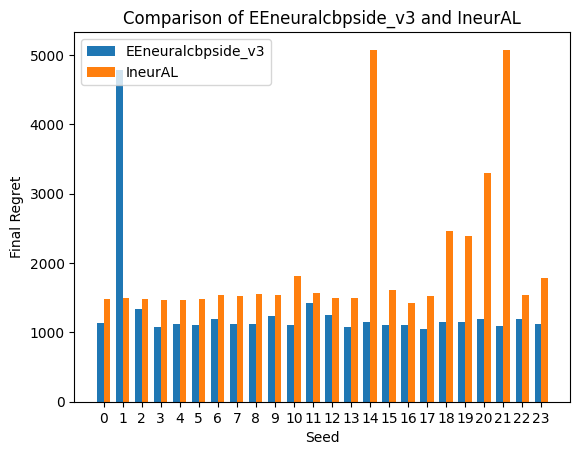

In [7]:
import matplotlib.pyplot as plt
# Creating a barchart

n_folds = 25
horizon = 9999
context = 'MNISTbinary'
case = 'case1'

material = {
    'EEneuralcbpside_v3': {'color': [0, 255, 0], 'label': 'EEneuralcbpside_v3'},
    'EEneuralcbpside_v5': {'color': [0, 255, 0], 'label': 'EEneuralcbpside_v5'},
    # 'margin': {'color': [255, 128, 0], 'label': 'Margin'},
    # 'cesa': {'color': [0, 255, 250], 'label': 'Cesa'},
    'ineural': {'color': [0, 0, 255], 'label': 'IneurAL'},
}

final_regrets = {}

# Collect final regrets
for agent_name in material.keys():
    color, l_label = material[agent_name]['color'], material[agent_name]['label']
    direct = './results/'
    path = os.path.join(direct, '{}_{}_{}_{}_{}.pkl.gz'.format(case, context, horizon, n_folds, agent_name))
    result = loadall_results2(path, n_folds)
    result = result[1:]
    result = result.astype(np.float32)

    # Store the final regret of each realization
    final_regrets[l_label] = result[:, -1]



bar_width = 0.35
index = np.arange(len(final_regrets['EEneuralcbpside_v3']))

fig, ax = plt.subplots()
bar1 = ax.bar(index, final_regrets['EEneuralcbpside_v3'], bar_width, label='EEneuralcbpside_v3')
# bar1 = ax.bar(index, final_regrets['EEneuralcbpside_v5'], bar_width, label='EEneuralcbpside_v5')
bar2 = ax.bar(index + bar_width, final_regrets['IneurAL'], bar_width, label='IneurAL')

ax.set_xlabel('Seed')
ax.set_ylabel('Final Regret')
ax.set_title('Comparison of EEneuralcbpside_v3 and IneurAL')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels([str(i) for i in range(len(final_regrets['EEneuralcbpside_v3']))])
ax.legend()

# plt.show()
# plt.savefig('./figures/{}_barchart.pdf'.format(case), dpi=380, bbox_inches='tight')